# Pydub
For this tutorial we will use Pydub to edit audio files. More information on Pydub is available at: https://github.com/jiaaro/pydub

To edit MP3 files, Pydub does require FFMPEG on your machine or the server you are using. I have installed it on Deepnote as a customization of this Virtual Environment, but Colab has FFMPEG on it already if you want to use Pydub there.  On your own computer you will want to install it to edit with MP3 files. 

The Pydub page (above) has information on installing FFMEG on your computer.  

You can also look at the DataCamp overview of Pydub here: https://s3.amazonaws.com/assets.datacamp.com/production/course_17718/slides/chapter3.pdf



## Audio files
You can upload audio files into Colab to the left (in the folder icone). There files only stay here for today though, and are then deleted.  Your script files will remain on Colab  (in your Google Drive)  but the upload files go away at the end of the day.

The selected sample music for this tutorial are from: https://youtube.com/audiolibrary.  You can, of course, download any music you want, and then upload it (drag-n-drop) into the Colab folder.  

We start by installing and importing the Pydub in our notebook on Colab.

In [ ]:
# I have installed pydub on the server with the requirements.txt file when starting it, but if didn't then use !pip install pydub 
import pydub as pydub

Next we will use Pydub to make "audio segments" of the clips so that we can work with them.  Segments are immutable (i.e., they can't be changed") once they are created, but if you change the original audio then it will be updated the next time the python script runs.

More information on the pydub API elements is at: https://github.com/jiaaro/pydub/blob/master/API.markdown



In [ ]:
from pydub import AudioSegment
clip_1 = AudioSegment.from_mp3("Circle Dance - SefChol.mp3")
clip_2 = AudioSegment.from_mp3("Soft Knives - SefChol.mp3")

The music files are little long and large to work with quickly, so for this tutorial let's just take the first 5 seconds, and save that file Colab.

In [ ]:

beginning_clip_1 = clip_1[:5000]
beginning_clip_2 = clip_2[:5000]

We can now save these new smaller files.

In [ ]:

beginning_clip_1.export('beginning_clip_1.mp3', format="mp3")
beginning_clip_2.export('beginning_clip_2.mp3', format="mp3")

<_io.BufferedRandom name='beginning_clip_2.mp3'>

In [ ]:
from IPython.display import Audio
Audio("beginning_clip_1.mp3")

In [ ]:

combined = beginning_clip_1 + beginning_clip_2
combined.export('combined.mp3', format="mp3")
Audio("combined.mp3")

Let's make it a little quieter (i.e., reduce the dB)

In [ ]:
quieter_combined = combined - 10.5
quieter_combined.export('quieter_combined.mp3', format="mp3")
Audio("quieter_combined.mp3")

Or let's play it backwards (remember, the files are immutable so this works)

In [ ]:

backwards = combined.reverse()
backwards.export('backwards.mp3', format="mp3")
Audio("backwards.mp3")

Rather than have a hard transition from clip_1 to clip_2, let's fade them together.

In [ ]:
combined_cross_fade = beginning_clip_1.append(beginning_clip_2, crossfade=2000)
combined_cross_fade.export('combined_cross_fade.mp3', format="mp3")
Audio("combined_cross_fade.mp3")

Or let's do a 2 sec fade in, 3 sec fade out

In [ ]:

combined_faded_in_out = combined.fade_in(2000).fade_out(3000)
combined_faded_in_out.export('combined_faded_in_out.mp3', format="mp3")
Audio("combined_faded_in_out.mp3")

Let's repeat the  audio  twice.

In [ ]:
twice = combined_faded_in_out * 2
twice.export('twice.mp3', format="mp3")
Audio("twice.mp3")

Or just take the last 5 sec off the end

In [ ]:
end_of_twice = twice [-5000:]
end_of_twice.export('end_of_twice.mp3', format="mp3")
Audio("end_of_twice.mp3")

Let's record our voice to put in some non-music.  Use one of these sites to record, then save the file to your desktop, and lastly upload (drag-n-drop) it into Colab.

https://online-voice-recorder.com/ or https://voice-recorder-online.com/

In [ ]:
#play your newly recorded audio

Audio('test.mp3')

Now let's mix the spoken word into the music.

In [ ]:
voice_1 = AudioSegment.from_mp3("test.mp3")
part_1 = beginning_clip_1.append(voice_1, crossfade=600)
introduction = part_1.append(beginning_clip_2, crossfade=600)
introduction.export('introduction.mp3', format="mp3")
Audio("introduction.mp3")

We can also overlay audio files on top of each other.

In [ ]:
beginning_clip_2_quieter = beginning_clip_2 - 10
overlay_voice_1_clip_1 = beginning_clip_2_quieter.overlay(voice_1, loop=True)  # loop the shorter clip overlayed on top of the longer clip
overlay_voice_1_clip_1.export('overlay_voice_1_clip_1.mp3', format="mp3")
Audio("overlay_voice_1_clip_1.mp3")

In [ ]:
beginning_clip_2_quieter = (beginning_clip_2 - 10) *  2
overlay_voice_1_clip_1 = beginning_clip_2_quieter.overlay(voice_1, position=3000)  # start the shorter clip later on top of the longer clip
overlay_voice_1_clip_1.export('overlay_voice_1_clip_1.mp3', format="mp3")
Audio("overlay_voice_1_clip_1.mp3")

In [ ]:
beginning_clip_2_quieter = (beginning_clip_2 - 10)  * 2
overlay_voice_1_clip_1 = beginning_clip_2_quieter.overlay(voice_1, position=3000, gain_during_overlay= -10)  # change original during overlay
overlay_voice_1_clip_1.export('overlay_voice_1_clip_1.mp3', format="mp3")
Audio("overlay_voice_1_clip_1.mp3")

What is the files are at different levels of loudness?

In [ ]:

beginning_clip_1_louder = beginning_clip_1 + 5
different_volumes = beginning_clip_1_louder + beginning_clip_2_quieter
different_volumes.export('different_volumes.mp3', format="mp3")
Audio("different_volumes.mp3")


Pydub has a normalize function but it only works with WAV files it seems, so we will use a work-around.  If you have WAV files, use the Pydub function though.

In [ ]:


def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

normalized_sound = match_target_amplitude(different_volumes, 0.0)
normalized_sound.export("nomrmalizedAudio.mp3", format="mp3")

print(beginning_clip_1_louder.dBFS)
print(beginning_clip_2_quieter.dBFS)
print(normalized_sound.dBFS)

Audio("nomrmalizedAudio.mp3")

-9.691339637001024
-25.083741323344487
-7.762366511593926


Let's compare the results visually.  

In [ ]:
import librosa
import matplotlib

/root/venv/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


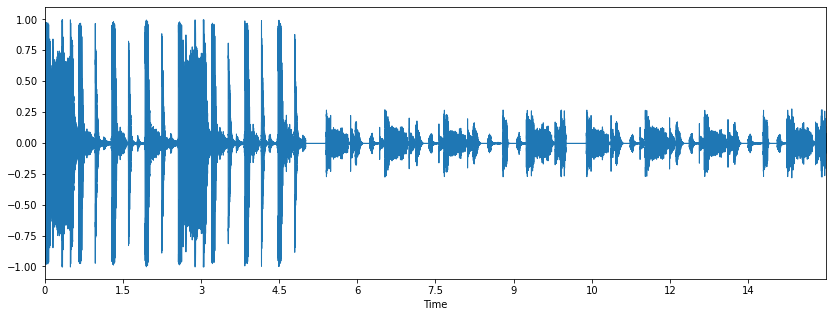

In [ ]:
# waveform without normalization

audio_data = "different_volumes.mp3"
x , sr = librosa.load(audio_data, sr=44100)
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

/root/venv/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


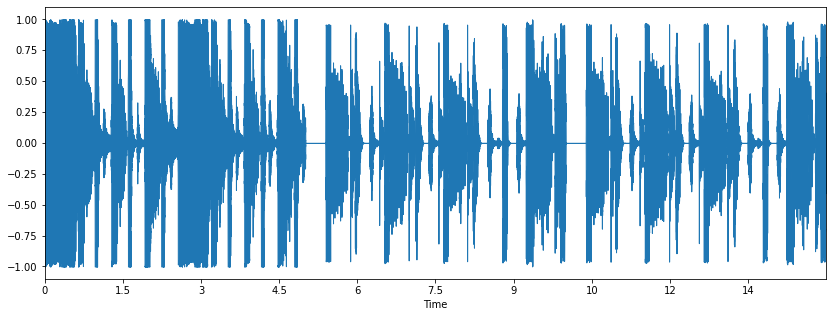

In [ ]:
# waveform with normalization

audio_data = "nomrmalizedAudio.mp3"
x , sr = librosa.load(audio_data, sr=44100)
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)



More on analyzing audio (including how to use ML to analyze music): https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html

In [ ]:
Audio("Saint_Cecilia.mp3")

In [ ]:

import spleeter as spleeter

In [ ]:
!spleeter separate Saint_Cecilia.mp3 -d 60 -o output/ -c mp3  
# Saint Celcilia by the Foo Fighters is a free song on Amazon the day I made this
# -d is duration of 60 seconds
# -o is the output directory
# -c is the format (WAV is default)

INFO:spleeter:File output/Saint_Cecilia/vocals.mp3 written succesfully
INFO:spleeter:File output/Saint_Cecilia/accompaniment.mp3 written succesfully


In [ ]:

Audio("output/Saint_Cecilia/vocals.mp3")

Now let's mix it up with the earlier combined music clips and the new vocals from the Foo Fighters.

In [ ]:
vocals = AudioSegment.from_mp3("output/Saint_Cecilia/vocals.mp3")
quite_combined = AudioSegment.from_mp3("quieter_combined.mp3")
new_foo = vocals.overlay(quite_combined, loop=True)
new_foo.export('new_foo.mp3', format="mp3")
Audio("new_foo.mp3")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=8e77f4a6-7634-4561-ac87-dc8a378b455f' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>